In [16]:
import pickle
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import scipy.stats as sts
from config import *
import road_systems_ising
from road_systems_ising import *
from collections import defaultdict
import importlib

In [17]:
with open("data/nodes", "rb") as fp:  #Unpickling
    nodes = pickle.load(fp)
with open("data/edges", "rb") as fp:  #Unpickling
    edges = pickle.load(fp)
with open("data/traffic_network", "rb") as fp:  #Unpickling
    G = pickle.load(fp)
with open("data/relative_arrival_rates", "rb") as fp: #Unpcikling
    relative_arrival_rates = pickle.load(fp)
with open("data/optimal_network_flow", "rb") as fp:   #Unpickling
    netflow_values,results, conf_int, simulated_density,simualted_density_conf_int,road_wise_data = pickle.load(fp)

In [18]:
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
import matplotlib.animation as anim
import numpy as np
from IPython.display import HTML
from tqdm import tqdm
def make_animation(sim, total_frames, steps_per_frame=1, interval=100, title = ''):
    def update(frame_number):
        for _ in range(steps_per_frame):
            sim.update()
        progress_bar.update(1)
        return [sim.draw(title)]

    progress_bar = tqdm(total=total_frames)
    animation = FuncAnimation(
        sim.figure, update, init_func=lambda: [], frames=total_frames, interval=interval)
    output = HTML(animation.to_html5_video())
    sim.figure.clf()
    return output


In [19]:
import road_systems_ising
importlib.reload(road_systems_ising)
from road_systems_ising import *

100%|██████████| 1500/1500 [00:03<00:00, 468.96it/s]
/Users/gordonma/PycharmProjects/pythonProject1/road_systems_ising.py:273: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  self.axes.plot([row[0], row[2]], [row[1], row[3]], color="black", zorder = 1)


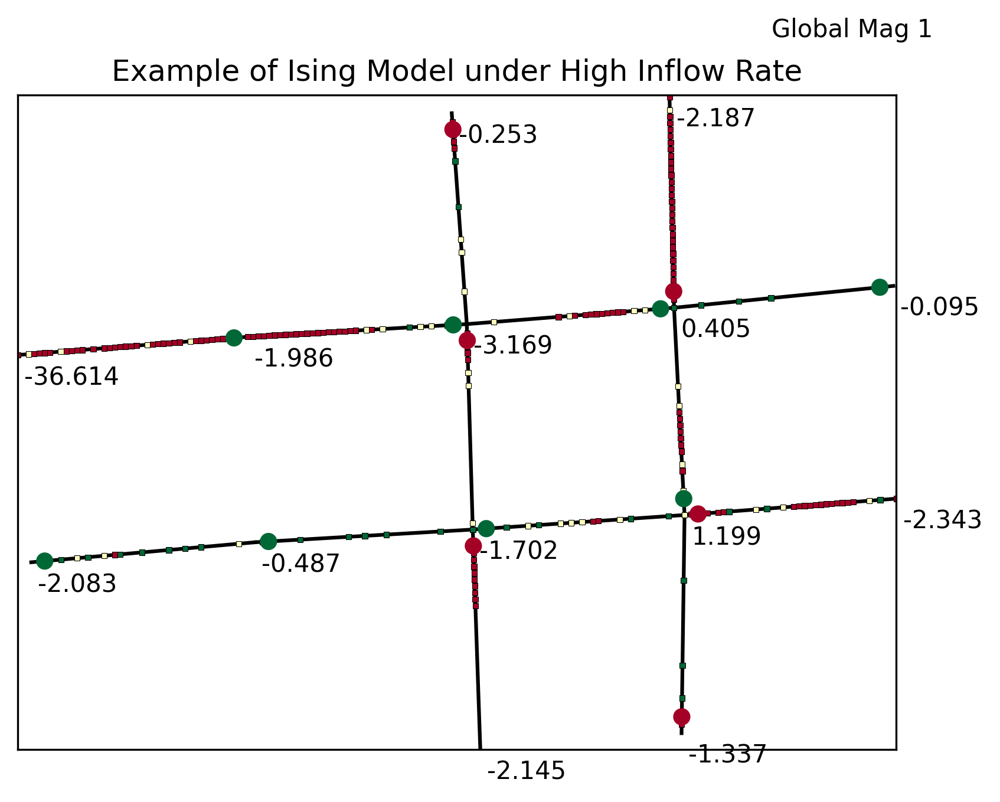

In [20]:
sim = TrafficSystemIsing()
out = sim.build_network(edges, nodes, relative_arrival_rates, netflow_rate = 1.2, traffic_cycle = [36,54],
                        ising_params = [1,1,0.2,5])
for __ in tqdm(range(1500)):
    sim.update()
    
sim.draw("Example of Ising Model under High Inflow Rate")


In [21]:
def real_flow_rate(sim, cut_off_time):
    """
    Returns the real inflow and outflow rate through the system
    
    return:
        inflow_rate : float
        outflow_rate: float
    """
    cars_out = 0
    for node in sim.outflows:
        cars_out += (len([x for x in node.pool if x.entranceTime > cut_off_time]))
    outflow_rate = cars_out / (sim.time - cut_off_time)
    #Cars out + cars in system = how many cars went into the system
    #Assume sim.time >> cut_off_time so no vehicles from before cutoff is in the system
    inflow_rate = (cars_out + sim.cars_in_system) / (sim.time - cut_off_time)
    return(inflow_rate,outflow_rate)



In [22]:
sim_lengths = []
for i in G.edges(data = True):
    sim_lengths.append([i[2]["Edge_ID"],i[2]["sim_distance"]])
sim_dists = pd.DataFrame(sim_lengths, columns = ["Road_ID", "simDist"])
def compute_weighted_hmean(dataCollection):
    weighted_harmonicAverages = []
    for frame in dataCollection:
        df = frame.merge(sim_dists,left_on = "Road_ID", right_on = "Road_ID" )
        weighted_harmonicAverages.append(sts.hmean(df["harmonicAverageSpeed"], weights = df["simDist"]))
    avgHmean = np.mean(weighted_harmonicAverages)
    errHmean = sts.sem(weighted_harmonicAverages)
    return(avgHmean,errHmean)

In [23]:
with open("data/optimal_network_flow", "rb") as fp:   #Unpickling
    netflow_values,results, conf_int, simulated_density,simualted_density_conf_int,road_wise_data = pickle.load(fp)

avgHmeans = []
errHmeans = []
for dfCollection in road_wise_data:
    avgHmean,errHmean = compute_weighted_hmean(dfCollection)
    avgHmeans.append(avgHmean)
    errHmeans.append(errHmean)
results_opt_orig = [netflow_values,avgHmeans,errHmeans,simulated_density,simualted_density_conf_int]



In [24]:
def flow_rate_obj(x):
    
    obj_value = 0
    begin_collection = 600
    run_until = 4500
    flow_rate_indexes = [4,7,10,15,22,30,38]
    for flow_rate_idx in flow_rate_indexes:
        flow_rate = netflow_values[flow_rate_idx]
        for trial in range(1):
            sim = TrafficSystemIsing()
            out = sim.build_network(edges, nodes, relative_arrival_rates, netflow_rate = flow_rate, traffic_cycle = [36,54],
                                ising_params = x)
            for __ in range(run_until):
                sim.update()
            plt.close()
    
            inflow, outflow = real_flow_rate(sim, begin_collection)
            #We want to minimize the deviation from setting params
            deviation_from_real_inflow = (1- inflow/flow_rate)**2
            dev_from_net_outflow_rate = (1- outflow/flow_rate)**2
            
            
            #Compute the Harmonic Average
            cars = []
            for outflow in sim.outflows:
                for car in outflow.pool:
                    if car.exitTime > begin_collection:
                        cars.append(car)
            avg_speeds = [((car.distanceTravelled *cell_size )/ (car.exitTime - car.entranceTime)) /
                          kmh_to_ms_conversion 
                          for car in cars]
            
            car_harmonic_avg_speed = statistics.harmonic_mean(avg_speeds)
            #The first index is the harmonic average of the original data 
            baseline_data_harmonic_avg = results_opt_orig[1][flow_rate_idx]
            #Limit value, since baseline harmonic avg is near 0 at high density.
            proportion_improvement = min(2*(np.log(car_harmonic_avg_speed / baseline_data_harmonic_avg))**2,1)
            
            #Every 90 seconds, we flip twice. We want to reward good flipping and not overflipping
            global_cycles = (run_until // np.sum(sim.traffic_manager.master_cycle))*2
            
            #Either too much or too little flips from the global clock will be penalized
            
            percentage_flip_diff = (
                                    1- (sim.traffic_manager.signs_flipped /
                                    (global_cycles*len(sim.traffic_manager.nodes))
                                       )
                                   )**2
            #Minimize deviations from input params, maximize harmonic average speed
            #Penalize too much or too little flips
            #Reward Improvement in Harmonic Average Proportionally to the baseline model
            obj_value += (10*deviation_from_real_inflow + 4*dev_from_net_outflow_rate +
                          7*percentage_flip_diff - 4*proportion_improvement )
            del sim
            
    return obj_value
            
            
            

In [25]:
from skopt import gp_minimize


# !!!Warning!!!
Costly cell to run below. 

In [27]:
from skopt.space import Real
res = gp_minimize(flow_rate_obj,dimensions= [Real(1e-10,10),Real(0.9,1.1),Real(-2,2),Real(0,10)],
                  n_calls = 200, 
                  n_jobs = -1,
                  verbose = True)



Iteration No: 1 started. Evaluating function at random point.
Iteration No: 1 ended. Evaluation done at random point.
Time taken: 84.2419
Function value obtained: 49.6665
Current minimum: 49.6665
Iteration No: 2 started. Evaluating function at random point.
Iteration No: 2 ended. Evaluation done at random point.
Time taken: 93.2515
Function value obtained: 35.2683
Current minimum: 35.2683
Iteration No: 3 started. Evaluating function at random point.
Iteration No: 3 ended. Evaluation done at random point.
Time taken: 85.0013
Function value obtained: 17.0148
Current minimum: 17.0148
Iteration No: 4 started. Evaluating function at random point.
Iteration No: 4 ended. Evaluation done at random point.
Time taken: 85.0610
Function value obtained: 65.9441
Current minimum: 17.0148
Iteration No: 5 started. Evaluating function at random point.
Iteration No: 5 ended. Evaluation done at random point.
Time taken: 83.2638
Function value obtained: 30.8689
Current minimum: 17.0148
Iteration No: 6 star

/Users/gordonma/PycharmProjects/pythonProject1/.venv/lib/python3.9/site-packages/skopt/optimizer/optimizer.py:517: UserWarning: The objective has been evaluated at point [1e-10, 1.1, 2.0, 10.0] before, using random point [4.897446550592046, 1.034184661629983, -0.5356906793209875, 1.1186106483608051]
  warnings.warn(


Iteration No: 15 ended. Search finished for the next optimal point.
Time taken: 142.7620
Function value obtained: 42.2774
Current minimum: -2.9946
Iteration No: 16 started. Searching for the next optimal point.


/Users/gordonma/PycharmProjects/pythonProject1/.venv/lib/python3.9/site-packages/skopt/optimizer/optimizer.py:517: UserWarning: The objective has been evaluated at point [1e-10, 1.1, 2.0, 10.0] before, using random point [2.673347151683785, 0.9058641381809541, 1.9562330913291386, 0.4735299560683649]
  warnings.warn(


Iteration No: 16 ended. Search finished for the next optimal point.
Time taken: 143.4849
Function value obtained: 26.1706
Current minimum: -2.9946
Iteration No: 17 started. Searching for the next optimal point.


/Users/gordonma/PycharmProjects/pythonProject1/.venv/lib/python3.9/site-packages/skopt/optimizer/optimizer.py:517: UserWarning: The objective has been evaluated at point [1e-10, 1.1, 2.0, 10.0] before, using random point [7.003641077418355, 0.9708621001065892, -0.8733833749899051, 5.592456205312065]
  warnings.warn(


Iteration No: 17 ended. Search finished for the next optimal point.
Time taken: 154.8370
Function value obtained: 46.8611
Current minimum: -2.9946
Iteration No: 18 started. Searching for the next optimal point.


/Users/gordonma/PycharmProjects/pythonProject1/.venv/lib/python3.9/site-packages/skopt/optimizer/optimizer.py:517: UserWarning: The objective has been evaluated at point [1e-10, 1.1, 2.0, 10.0] before, using random point [0.3263065454484026, 1.0892919424405152, 1.2204041595102044, 6.82365591255901]
  warnings.warn(


Iteration No: 18 ended. Search finished for the next optimal point.
Time taken: 162.4990
Function value obtained: -2.9137
Current minimum: -2.9946
Iteration No: 19 started. Searching for the next optimal point.
Iteration No: 19 ended. Search finished for the next optimal point.
Time taken: 151.7414
Function value obtained: 1.6440
Current minimum: -2.9946
Iteration No: 20 started. Searching for the next optimal point.


/Users/gordonma/PycharmProjects/pythonProject1/.venv/lib/python3.9/site-packages/skopt/optimizer/optimizer.py:517: UserWarning: The objective has been evaluated at point [1e-10, 1.1, 2.0, 10.0] before, using random point [3.527364184356827, 0.9260553900054398, 1.0797223981676032, 1.4886559701253834]
  warnings.warn(


Iteration No: 20 ended. Search finished for the next optimal point.
Time taken: 146.1350
Function value obtained: 32.9543
Current minimum: -2.9946
Iteration No: 21 started. Searching for the next optimal point.
Iteration No: 21 ended. Search finished for the next optimal point.
Time taken: 96.1957
Function value obtained: -2.4724
Current minimum: -2.9946
Iteration No: 22 started. Searching for the next optimal point.
Iteration No: 22 ended. Search finished for the next optimal point.
Time taken: 97.9302
Function value obtained: -2.1561
Current minimum: -2.9946
Iteration No: 23 started. Searching for the next optimal point.
Iteration No: 23 ended. Search finished for the next optimal point.
Time taken: 108.0678
Function value obtained: -4.6274
Current minimum: -4.6274
Iteration No: 24 started. Searching for the next optimal point.
Iteration No: 24 ended. Search finished for the next optimal point.
Time taken: 100.9751
Function value obtained: -4.5004
Current minimum: -4.6274
Iteration N

In [28]:
res.x

[1e-10, 1.1, 0.2395218280895155, 8.079511921035698]

In [29]:
sim = TrafficSystemIsing()
out = sim.build_network(edges, nodes, relative_arrival_rates, netflow_rate = 1.2, traffic_cycle = [36,54],
                                ising_params = res.x)

make_animation(sim, total_frames=500, steps_per_frame=1, title = "Ising Sim with General-Fitted Optimized Parameters")



  0%|          | 0/500 [00:00<?, ?it/s]/Users/gordonma/PycharmProjects/pythonProject1/road_systems_ising.py:273: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  self.axes.plot([row[0], row[2]], [row[1], row[3]], color="black", zorder = 1)
  0%|          | 2/500 [00:01<07:21,  1.13it/s]/Users/gordonma/PycharmProjects/pythonProject1/road_systems_ising.py:273: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  self.axes.plot([row[0], row[2]], [row[1], row[3]], color="black", zorder = 1)
/Users/gordonma/PycharmProjects/pythonProject1/road_systems_ising.py:273: FutureWarning: Series.__getitem__ treating keys as positions is depr

<Figure size 1920x1440 with 0 Axes>

<Axes: title={'center': 'Convergence plot'}, xlabel='Number of calls $n$', ylabel='$\\min f(x)$ after $n$ calls'>

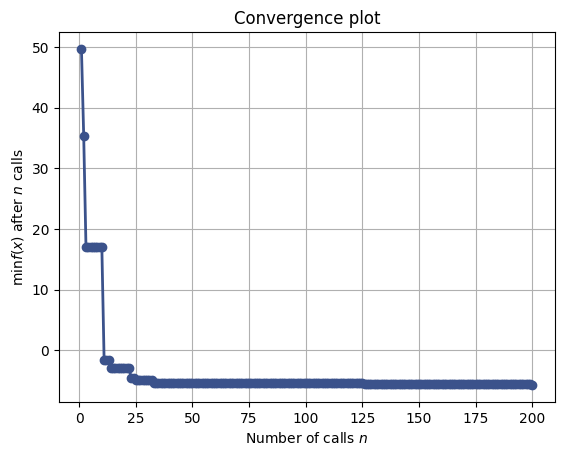

In [30]:
from skopt.plots import plot_convergence
plot_convergence(res)

In [31]:
#Runs the second test with only one point to fit the model to
def flow_rate_obj_optimal_point(x):
    
    obj_value = 0
    begin_collection = 600
    run_until = 4500
    flow_rate_indexes = [10]
    for flow_rate_idx in flow_rate_indexes:
        flow_rate = netflow_values[flow_rate_idx]
        for trial in range(3):
            sim = TrafficSystemIsing()
            out = sim.build_network(edges, nodes, relative_arrival_rates, netflow_rate = flow_rate, traffic_cycle = [36,54],
                                ising_params = x)
            for __ in range(run_until):
                sim.update()
            plt.close()
    
            inflow, outflow = real_flow_rate(sim, begin_collection)
            #We want to minimize the deviation from setting params
            deviation_from_real_inflow = (1- inflow/flow_rate)**2
            dev_from_net_outflow_rate = (1- outflow/flow_rate)**2
            
            
            #Compute the Harmonic Average
            cars = []
            for outflow in sim.outflows:
                for car in outflow.pool:
                    if car.exitTime > begin_collection:
                        cars.append(car)
            avg_speeds = [((car.distanceTravelled *cell_size )/ (car.exitTime - car.entranceTime)) /
                          kmh_to_ms_conversion 
                          for car in cars]
            
            car_harmonic_avg_speed = statistics.harmonic_mean(avg_speeds)
            #The first index is the harmonic average of the original data 
            baseline_data_harmonic_avg = results_opt_orig[1][flow_rate_idx]
            proportion_improvement = min(2*(np.log(car_harmonic_avg_speed / baseline_data_harmonic_avg))**2,4)
            
            #Every 90 seconds, we flip twice. We want to reward good flipping and not overflipping
            global_cycles = (run_until // np.sum(sim.traffic_manager.master_cycle))*2
            
            #Either too much or too little flips from the global clock will be penalized
            
            percentage_flip_diff = (
                                    1- (sim.traffic_manager.signs_flipped /
                                    (global_cycles*len(sim.traffic_manager.nodes))
                                       )
                                   )**2
            #Minimize deviations, maximize harmonic average speed.
            obj_value += (10*deviation_from_real_inflow + 4*dev_from_net_outflow_rate +
                          7*percentage_flip_diff - 2*proportion_improvement )
            del sim
            
    return obj_value
            
            
            

In [32]:
from skopt.space import Real
res2 = gp_minimize(flow_rate_obj_optimal_point,dimensions= [Real(1e-10,10),Real(0.9,1.1),Real(-2,2),Real(0,10)],
                  n_calls = 200, 
                  n_jobs = -1,
                  verbose = True)

Iteration No: 1 started. Evaluating function at random point.
Iteration No: 1 ended. Evaluation done at random point.
Time taken: 27.0577
Function value obtained: 27.3552
Current minimum: 27.3552
Iteration No: 2 started. Evaluating function at random point.
Iteration No: 2 ended. Evaluation done at random point.
Time taken: 146.8532
Function value obtained: 32.2124
Current minimum: 27.3552
Iteration No: 3 started. Evaluating function at random point.
Iteration No: 3 ended. Evaluation done at random point.
Time taken: 28.3057
Function value obtained: 26.9741
Current minimum: 26.9741
Iteration No: 4 started. Evaluating function at random point.
Iteration No: 4 ended. Evaluation done at random point.
Time taken: 28.8230
Function value obtained: 13.1995
Current minimum: 13.1995
Iteration No: 5 started. Evaluating function at random point.
Iteration No: 5 ended. Evaluation done at random point.
Time taken: 30.7917
Function value obtained: 30.7539
Current minimum: 13.1995
Iteration No: 6 sta

In [33]:
sim = TrafficSystemIsing()
out = sim.build_network(edges, nodes, relative_arrival_rates, netflow_rate = 0.52, traffic_cycle = [36,54],
                                ising_params = res2.x)

make_animation(sim, total_frames=1500, steps_per_frame=1, title = "Ising Traffic Sim with Locally Optimized Param")



  0%|          | 0/1500 [00:00<?, ?it/s]/Users/gordonma/PycharmProjects/pythonProject1/road_systems_ising.py:273: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  self.axes.plot([row[0], row[2]], [row[1], row[3]], color="black", zorder = 1)
  0%|          | 2/1500 [00:01<20:01,  1.25it/s]/Users/gordonma/PycharmProjects/pythonProject1/road_systems_ising.py:273: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  self.axes.plot([row[0], row[2]], [row[1], row[3]], color="black", zorder = 1)
  0%|          | 3/1500 [00:01<12:54,  1.93it/s]/Users/gordonma/PycharmProjects/pythonProject1/road_systems_ising.py:273: FutureWarning: Ser

<Figure size 1920x1440 with 0 Axes>

In [34]:
with open("data/IsingOptimizationRes", "wb") as fp:   #Pickling
    pickle.dump([res,res2], fp)
    

In [35]:
with open("data/IsingOptimizationRes", "rb") as fp:  #Unpickling
    res,res2 = pickle.load(fp)

<Axes: title={'center': 'Convergence plot'}, xlabel='Number of calls $n$', ylabel='$\\min f(x)$ after $n$ calls'>

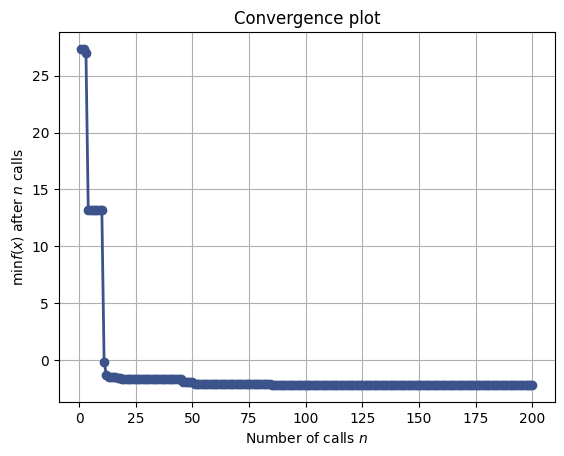

In [36]:
plot_convergence(res2)


In [37]:
def differences_from_measurement(netflow_rate, *args):
    
    sim, edges, nodes, relative_arrival_rates,ising_params = args 
    out = sim.build_network(edges, nodes, relative_arrival_rates, netflow_rate, traffic_cycle = [36,54],
                                ising_params = ising_params, dpi = 10)
    
    #We collect an hour of traffic-flow data
    for __ in range(4500):
        sim.update()
    sim.figure.clf()
    trial_result = []
    for u,v, data in sim.traffic_grid.edges(data = True):
        values_of_interest = ["harmonicAverageSpeed", "averageSpeed", "standardDeviationSpeed", 
                              "travelTimeStandardDeviation", "averageTravelTime"]
        
        simulated_road = data['road']

        road_speeds = pd.DataFrame(simulated_road.data, columns = ["harmonicAverageSpeed", "averageSpeed", "standardDeviationSpeed","Density"]).mean()
        try:
            averageTravelTime = np.mean(simulated_road.travel_times)
        except:
            print("exception")
            averageTravelTime = 0
        try:
            travelTimeStandardDeviation = np.std(simulated_road.travel_times)
        except:
            print("exception")
            travelTimeStandardDeviation = 0
        results = pd.concat((
            pd.Series(simulated_road.ID, index = ["Road_ID"]),
            road_speeds,
            pd.Series(averageTravelTime, index = ["averageTravelTime"]), 
            pd.Series(travelTimeStandardDeviation, index = ["travelTimeStandardDeviation"])), 
            axis = 0
        )
        
        trial_result.append(results)

    output_df = pd.concat(trial_result, axis = 1, ignore_index = True).transpose().sort_values(by = "Road_ID", ignore_index = True)
    
    return(sim, output_df)


In [38]:
import scipy.stats as sts
def ising_config_benchmark(ising_params):
    netflow_values = np.linspace(0.02,2.02,41)
    avgHmeans = []
    errHmeans = []
    avg_inflows = []
    avg_outflows = []
    simulated_density = []
    simualted_density_conf_int = []
    road_wise_data = []
    trials = 5
    progress_bar = tqdm(total=len(netflow_values)*trials)
    for netflow_rate in netflow_values:
        complete_dataframes =[]
        avg_density = []
        avg_inflow = []
        avg_outflow = []
        for __ in range(trials):
            progress_bar.update(1)
            sim,trial_result = differences_from_measurement(netflow_rate,
                                                                    TrafficSystemIsing(),
                                                                    edges, 
                                                                    nodes, 
                                                                    relative_arrival_rates,
                                                                   ising_params)
            
            inflow, outflow = real_flow_rate(sim, 600)
            avg_density.append(np.mean(sim.density))
            avg_inflow.append(inflow)
            avg_outflow.append(outflow)
            complete_dataframes.append(trial_result)
            plt.close()
            
                
        avgHmean,errHmean = compute_weighted_hmean(complete_dataframes)
        
        avg_inflows.append(np.mean(avg_inflow))
        avg_outflows.append(np.mean(avg_outflow))
        avgHmeans.append(avgHmean)
        errHmeans.append(errHmean)
        road_wise_data.append(complete_dataframes)
        simulated_density.append(np.mean(avg_density))
        simualted_density_conf_int.append(sts.sem(avg_density)*1.96)
    return(netflow_values,avgHmeans,errHmeans,simulated_density,simualted_density_conf_int,avg_inflows,avg_outflows, road_wise_data)


In [39]:
netflow_values,avgHmeans,errHmeans,simulated_density,simualted_density_conf_int,avg_inflows,avg_outflows, road_wise_data = ising_config_benchmark(res.x)
results_opt_param1 = [netflow_values,avgHmeans,errHmeans,simulated_density,
                      simualted_density_conf_int,avg_inflows,avg_outflows, road_wise_data]


100%|██████████| 205/205 [40:12<00:00, 11.77s/it]


In [40]:
netflow_values,avgHmeans,errHmeans,simulated_density,simualted_density_conf_int,avg_inflows,avg_outflows, road_wise_data = ising_config_benchmark(res2.x)
results_opt_param2 = [netflow_values,avgHmeans,errHmeans,simulated_density,
                      simualted_density_conf_int,avg_inflows,avg_outflows, road_wise_data]


100%|██████████| 205/205 [41:42<00:00, 12.21s/it]


In [41]:
with open("data/optimal_network_flow_ising_baseline", "rb") as fp:   #Unpickling
    netflow_values,simulated_density, simualted_density_conf_int,avg_inflows,avg_outflows, road_wise_data = pickle.load(fp)
avgHmeans = []
errHmeans = []
for dfCollection in road_wise_data:
    avgHmean,errHmean = compute_weighted_hmean(dfCollection)
    avgHmeans.append(avgHmean)
    errHmeans.append(errHmean)
results_opt_baseline = [netflow_values,avgHmeans,errHmeans,simulated_density,
                      simualted_density_conf_int,avg_inflows,avg_outflows, road_wise_data]

In [42]:
len(results_opt_baseline)

8

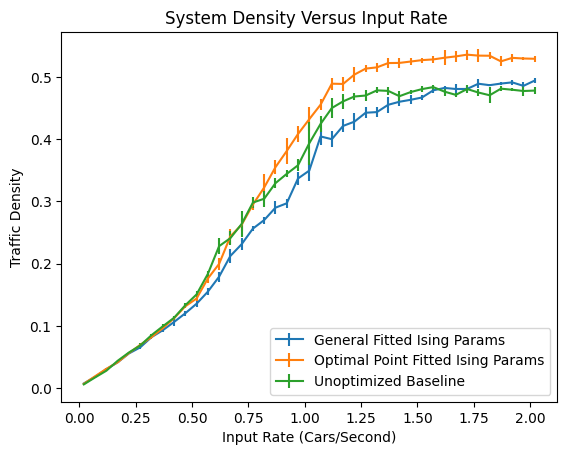

In [43]:
plot_titles = ["General Fitted Ising Params", "Optimal Point Fitted Ising Params", "Unoptimized Baseline"]

for i,dataset in enumerate([results_opt_param1,results_opt_param2,results_opt_baseline]):  
    netflow_values,avgHmeans,errHmeans,simulated_density,simualted_density_conf_int,avg_inflows,avg_outflows, road_wise_data = dataset
    plt.errorbar(netflow_values,simulated_density,simualted_density_conf_int, label = plot_titles[i])
plt.title("System Density Versus Input Rate ")
plt.xlabel("Input Rate (Cars/Second)")
plt.ylabel("Traffic Density")
plt.legend()
plt.show()


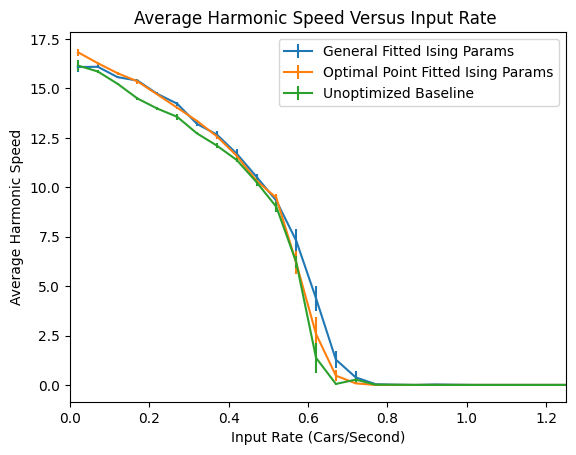

In [44]:
plot_titles = ["General Fitted Ising Params", "Optimal Point Fitted Ising Params", "Unoptimized Baseline"]

for i,dataset in enumerate([results_opt_param1,results_opt_param2,results_opt_baseline]):  
    netflow_values,avgHmeans,errHmeans,simulated_density,simualted_density_conf_int,avg_inflows,avg_outflows, road_wise_data = dataset
    plt.errorbar(netflow_values,avgHmeans,errHmeans, label = plot_titles[i])
plt.title("Average Harmonic Speed Versus Input Rate ")
plt.xlabel("Input Rate (Cars/Second)")
plt.ylabel("Average Harmonic Speed")
plt.legend()
plt.xlim(0,1.25)
plt.show()


In [45]:
import matplotlib.pyplot as plt
from matplotlib import cm, colors
def create_summary_plot(speed_index, var_of_interest,data, colormap = cm.RdYlGn,vmin = "default", vmax = "default", edges = edges ):
    nodes["type"] = nodes["type"].astype("category")
    
    summary_statistics = pd.concat(road_wise_data[speed_index]).astype({"Road_ID":np.int64}).groupby("Road_ID").mean()
    edges_empirical = summary_statistics.merge(edges.loc[:,["Edge_ID","start_x", "start_y", "end_x", "end_y"]],
                             left_on = "Road_ID", right_on = "Edge_ID" )
    #Preview Graph system, and Label Edges and Nodes for referencing

    fig, ax = plt.subplots(figsize=(8, 5))
    my_cmap = colormap
    if vmax =="default":
        vmax = edges_empirical[var_of_interest].max()
    if vmin == "default":
        vmin == edges_empirical[var_of_interest].min()
    my_norm = colors.Normalize(vmin=vmin, vmax= vmax)


    for i,row in enumerate(edges_empirical.iterrows()):
        row = row[1]
        ax.plot([row["start_x"],row["end_x"]],[row["start_y"],row["end_y"]], 
                 color = my_cmap(my_norm(edges_empirical[var_of_interest][i])), linewidth = 5)
        ax.text((row["start_x"]+row["end_x"])/2 + 5,(row["start_y"]+row["end_y"])/2 + 8 , f"E-{i}", fontstyle = "italic")
    node_col = {'inflow':'Blue', 'outflow':'Red', 'intersection': 'Green'}
    ax.scatter(nodes["x"] ,nodes["y"] , s = 30, c = nodes["type"].map(node_col), zorder = 3)
    fig.colorbar(cm.ScalarMappable(norm=my_norm, cmap=my_cmap), orientation="vertical", label=var_of_interest)
    for row in nodes.iterrows():
        row = row[1]
        plt.text(row[0]+5, row[1]+5, f"N-{row[3]}", fontweight = "bold")
    ax.set_title(f"Traffic Heat Map with Inflow rate {netflow_values[speed_index]:.2f} cars/s ")
    ax.axes.tick_params(axis='both', which='both', reset = True,  bottom='off', top='off', labelbottom='off', right='off',
                              left='off',
                              labelleft='off')
    ax.axes.xaxis.set_visible(False)
    ax.axes.yaxis.set_visible(False)
    return fig


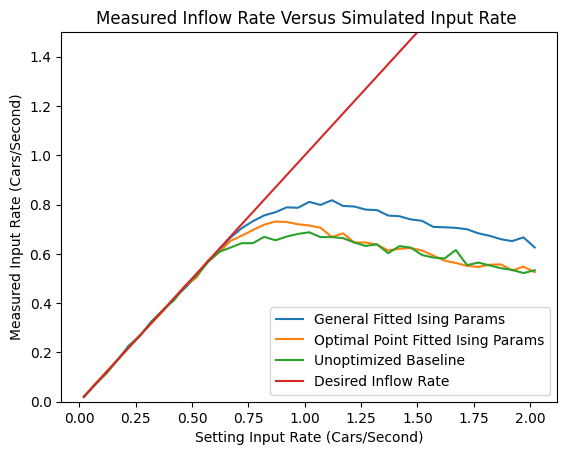

In [46]:
plot_titles = ["General Fitted Ising Params", "Optimal Point Fitted Ising Params", "Unoptimized Baseline"]

for i,dataset in enumerate([results_opt_param1,results_opt_param2,results_opt_baseline]):  
    netflow_values,avgHmeans,errHmeans,simulated_density,simualted_density_conf_int,avg_inflows,avg_outflows, road_wise_data = dataset
    plt.plot(netflow_values,avg_inflows, label = plot_titles[i])
plt.plot(netflow_values,netflow_values, label = "Desired Inflow Rate")
plt.title("Measured Inflow Rate Versus Simulated Input Rate ")
plt.xlabel("Setting Input Rate (Cars/Second)")
plt.ylabel("Measured Input Rate (Cars/Second)")
plt.ylim(0,1.5)
plt.legend()
plt.show()


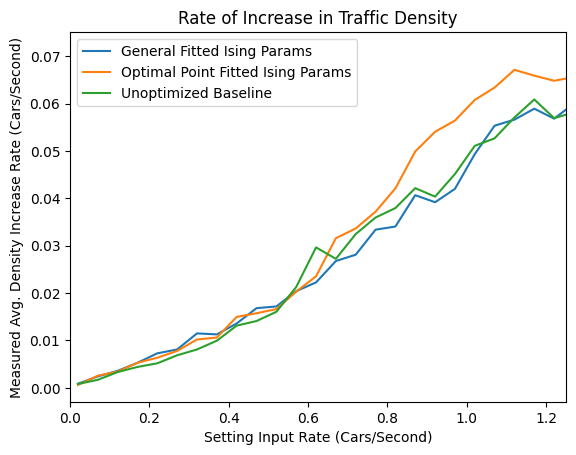

In [47]:
plot_titles = ["General Fitted Ising Params", "Optimal Point Fitted Ising Params", "Unoptimized Baseline"]

for i,dataset in enumerate([results_opt_param1,results_opt_param2,results_opt_baseline]):  
    netflow_values,avgHmeans,errHmeans,simulated_density,simualted_density_conf_int,avg_inflows,avg_outflows, road_wise_data = dataset
    plt.plot(netflow_values,np.array(avg_inflows)-np.array(avg_outflows), label = plot_titles[i])
plt.title("Rate of Increase in Traffic Density")
plt.xlabel("Setting Input Rate (Cars/Second)")
plt.ylabel("Measured Avg. Density Increase Rate (Cars/Second)")
plt.legend()
plt.xlim(0,1.25)
plt.show()

Loading Data of the Markov Matrix

In [48]:
with open("data/markov_matrix_1.5", "rb") as fp:  #Unpickling
    markov_matrix = pickle.load(fp)

In [49]:
netflow_values = np.linspace(0.02,2.02,41)
theoretical_system_density = []
out_cars = []
for input_rate in netflow_values:
    inflow_array = np.append([input_rate/30], np.zeros(14))
    current_array = inflow_array
    for __ in range(3000):
        current_array = np.dot(markov_matrix,current_array) + inflow_array
    out_cars.append(np.sum(current_array[-4:] * 30))
    theoretical_system_density.append(np.sum(current_array[1:-4]) / len(current_array[1:-4]))


In [50]:
netflow_values = np.linspace(0.02,2.02,41)
system_density = []
out_cars = []
for input_rate in netflow_values:
    inflow_array = np.append([input_rate/30], np.zeros(14))
    current_array = inflow_array
    for __ in range(3000):
        current_array = np.dot(markov_matrix,current_array) + inflow_array
    out_cars.append(np.sum(current_array[-4:] * 30))
    system_density.append(np.sum(current_array[1:-4]) / len(current_array[1:-4]))

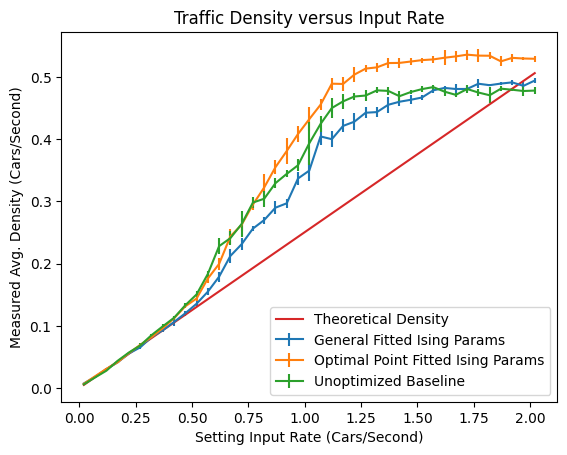

In [51]:
plot_titles = ["General Fitted Ising Params", "Optimal Point Fitted Ising Params", "Unoptimized Baseline"]

for i,dataset in enumerate([results_opt_param1,results_opt_param2,results_opt_baseline]):  
    netflow_values,avgHmeans,errHmeans,simulated_density,simualted_density_conf_int,avg_inflows,avg_outflows, road_wise_data = dataset
    plt.errorbar(netflow_values,simulated_density, simualted_density_conf_int,label = plot_titles[i])
plt.plot(netflow_values,theoretical_system_density, label = "Theoretical Density")
plt.title("Traffic Density versus Input Rate")
plt.xlabel("Setting Input Rate (Cars/Second)")
plt.ylabel("Measured Avg. Density (Cars/Second)")
plt.legend()
plt.show()